In [271]:
from sklearn.ensemble import RandomForestClassifier as RFC
import plotly.plotly as py
import plotly.figure_factory as ff
from plotly import tools
import pandas as pd
import os
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use('ggplot')
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import scale
from sklearn.model_selection import StratifiedKFold
import os
import pandas as pd
#import pandas_profiling
import statsmodels.formula.api as smf
from statsmodels.api import add_constant
import statsmodels.api as sm
#from sklearn.cross_validation import train_test_split as tts
import matplotlib.pyplot as plt
import scipy.stats as stats
from datetime import datetime 
import seaborn as sns
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from scipy import stats
import pylab
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
#from sklearn.cross_validation import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.neighbors import KNeighborsClassifier as KNC
from sklearn.metrics import roc_curve,auc
from sklearn.neighbors import KNeighborsRegressor as KNR
from sklearn.preprocessing import LabelEncoder as LE
#import sklearn.cross_validation
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score

from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier as DTC
#from xgboost import plot_importance
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from itertools import combinations
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectKBest, chi2,f_classif
from sklearn.feature_selection import SelectFromModel   
#from sklearn.cross_validation import cross_val_score
from collections import Counter
from imblearn.pipeline import make_pipeline as make_pipeline_imb
from imblearn.over_sampling import SMOTE
from imblearn.metrics import classification_report_imbalanced
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import train_test_split as tts
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectKBest, chi2,f_classif
from sklearn.feature_selection import SelectFromModel   

from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier , RandomForestClassifier  
from sklearn.model_selection import RandomizedSearchCV
# Hypthesis

from scipy.stats import ttest_1samp,ttest_ind,mannwhitneyu,levene,shapiro,wilcoxon,chisquare,chi2_contingency
import statsmodels.api as sm

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier as BC
from matplotlib.legend_handler import HandlerLine2D

import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

from sklearn.ensemble import BaggingClassifier as BC

In [182]:
train=pd.read_csv("bank.csv")

In [183]:
tr=train.select_dtypes(include='object').astype('category')

In [184]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 10 columns):
job          45211 non-null category
marital      45211 non-null category
education    45211 non-null category
default      45211 non-null category
housing      45211 non-null category
loan         45211 non-null category
contact      45211 non-null category
month        45211 non-null category
poutcome     45211 non-null category
Target       45211 non-null category
dtypes: category(10)
memory usage: 443.4 KB


In [185]:
cat_col=tr.columns.values

In [186]:
train.drop(cat_col,axis=1,inplace=True)

In [187]:
train=pd.concat([train,tr],axis=1)

In [188]:
marital=train.marital.unique().tolist()
edu=train.education.unique().tolist()
train['marital_by_edu']=np.nan
for i in marital:
    for z in edu:
        h= i + '/' + z
        train.marital_by_edu[(train.marital==i) & (train.education==z)] = h
        

In [189]:
train.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


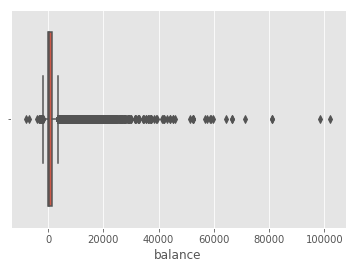

In [190]:
sns.boxplot(train.balance)

In [191]:
iqr=train.balance.quantile(.75)-train.balance.quantile(.25)
L_Cut=train.balance.quantile(.25) - (1.5 * iqr)
U_Cut=train.balance.quantile(.75) + (1.5 * iqr)
train.balance.clip_lower(L_Cut,inplace=True)
train.balance.clip_upper(U_Cut,inplace=True)

In [192]:
train['balance_status']=np.nan
train.balance_status[train.balance<=72]='Low'
train.balance_status[(train.balance>72)&(train.balance<=1428)]='Medium'
train.balance_status[train.balance>1428]='High'

In [193]:
train['age_status']=np.nan
train.age_status[train.age<=18]='Teenage'
train.age_status[(train.age>18)&(train.age<=39)]='Adult'
train.age_status[train.age>39]='Aged'

In [194]:
train['campaing_status']=np.nan
train.campaing_status[train.campaign<=2]="Less_Days"
train.campaing_status[(train.campaign>2)&(train.campaign<=5)]="Medium_Days"
train.campaing_status[(train.campaign>5)]="High_Days"

In [195]:
train['based_on_target']=np.nan
target=train.Target.unique().tolist()
balance_status=train.balance_status.unique().tolist()
age_status=train.age_status.unique().tolist()
campaign_status=train.campaing_status.unique().tolist()
married_by_edu=train.marital_by_edu.unique().tolist()
for i in target:
    for z in balance_status:
        for y in age_status:
            for x in campaign_status:
                for t in married_by_edu:
                    train.based_on_target[(train.Target==i) &(train.marital_by_edu==t) &(train.balance_status==z) & (train.age_status==y) & (train.campaing_status==x)]=i + '-T-' + z + '-B-' + y + '-A-' + x +'-C-'+t+'-mbe-'

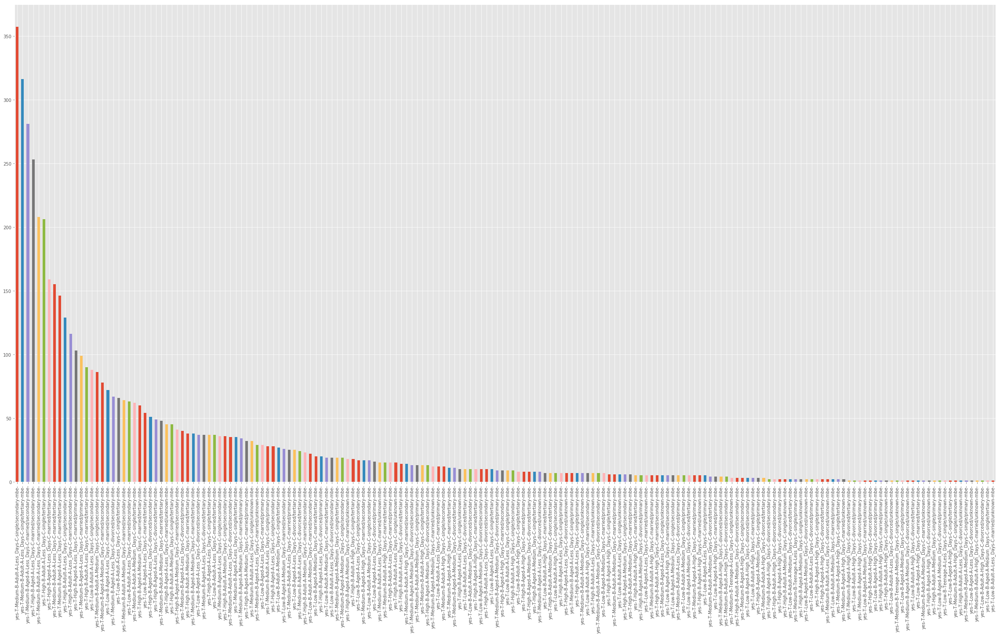

In [101]:
plt.figure(figsize=(40,20))
train[train.Target=='yes'].based_on_target.value_counts().plot(kind='bar')

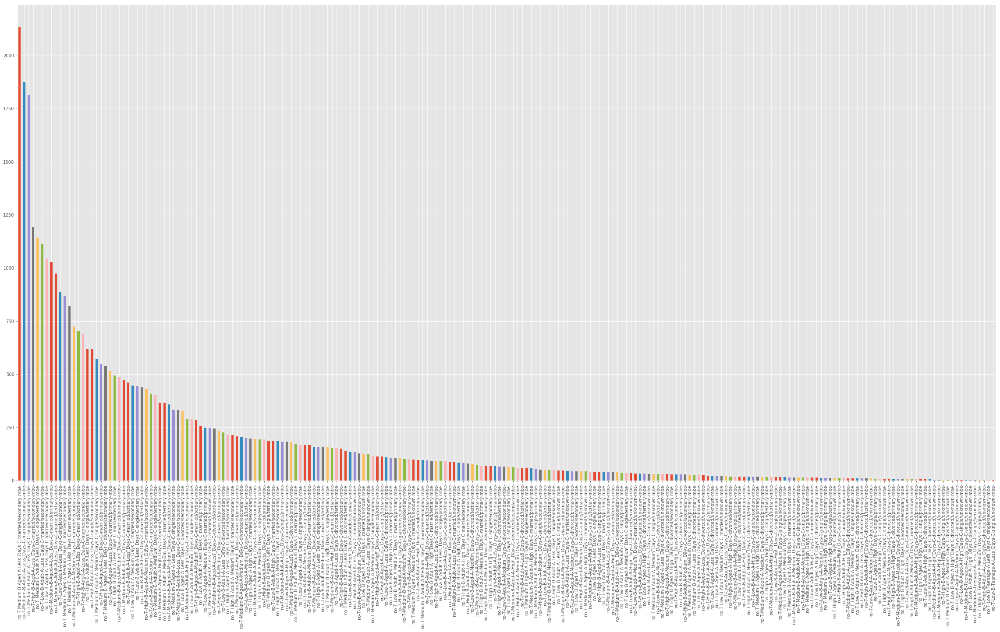

In [102]:
plt.figure(figsize=(40,20))
train[train.Target=='no'].based_on_target.value_counts().plot(kind='bar')

Text(0.5,0,'Job')

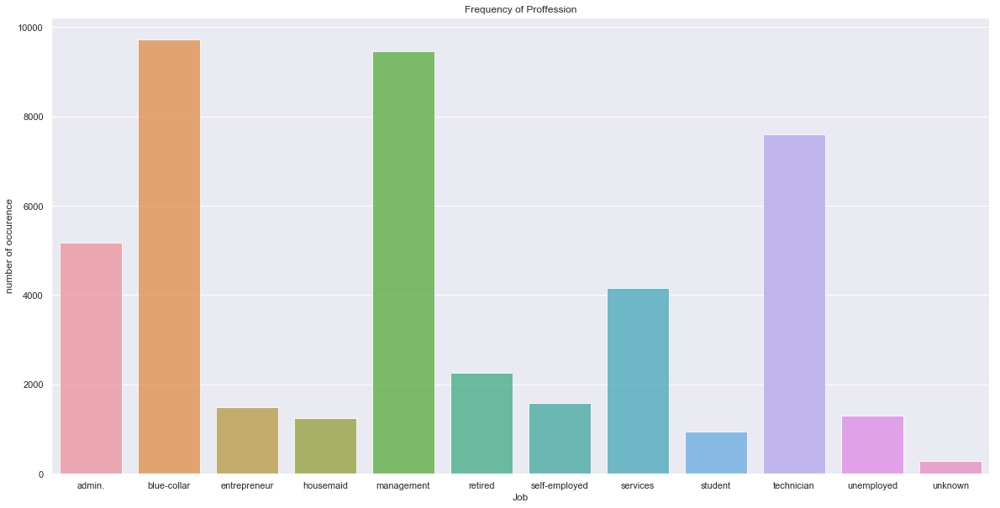

In [125]:
job_count=train.job.value_counts()
plt.figure(figsize=(20,10))
sns.set(style='darkgrid')
sns.barplot(job_count.index,job_count.values,alpha=.8)
plt.title('Frequency of Proffession')
plt.ylabel('number of occurence')
plt.xlabel('Job')

In [196]:
def count_plot(x):
    job_count=train[x].value_counts()
    plt.figure(figsize=(20,10))
    sns.set(style='darkgrid')
    print(sns.barplot(job_count.index,job_count.values,alpha=.8))
    plt.title(x)
    plt.ylabel('number of occurence')
    plt.xlabel(x)

AxesSubplot(0.125,0.125;0.775x0.755)


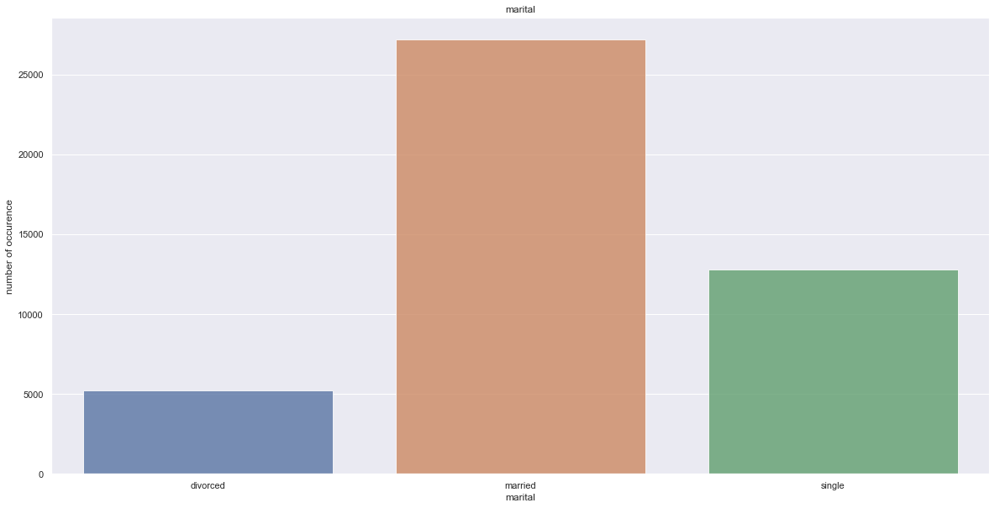

In [127]:
count_plot('marital')

AxesSubplot(0.125,0.125;0.775x0.755)


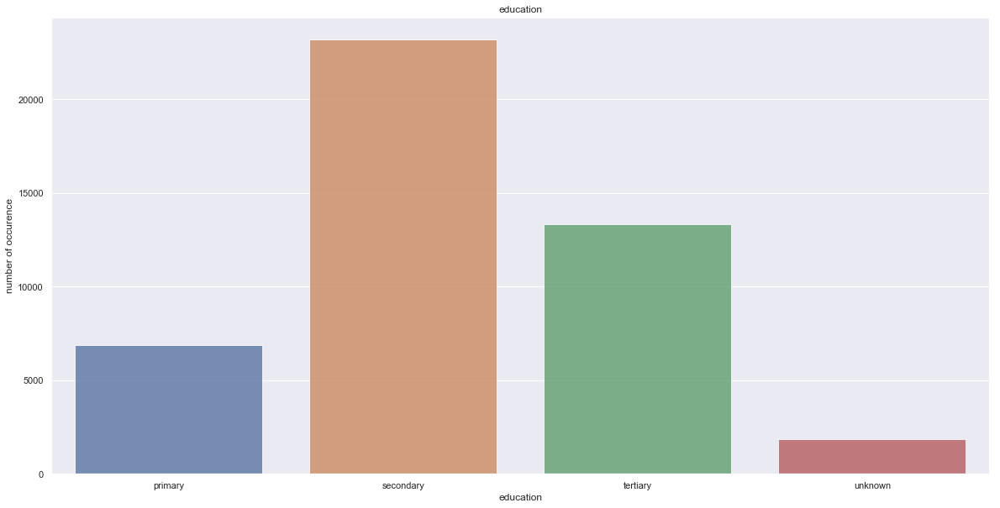

In [106]:
count_plot('education')

AxesSubplot(0.125,0.125;0.775x0.755)


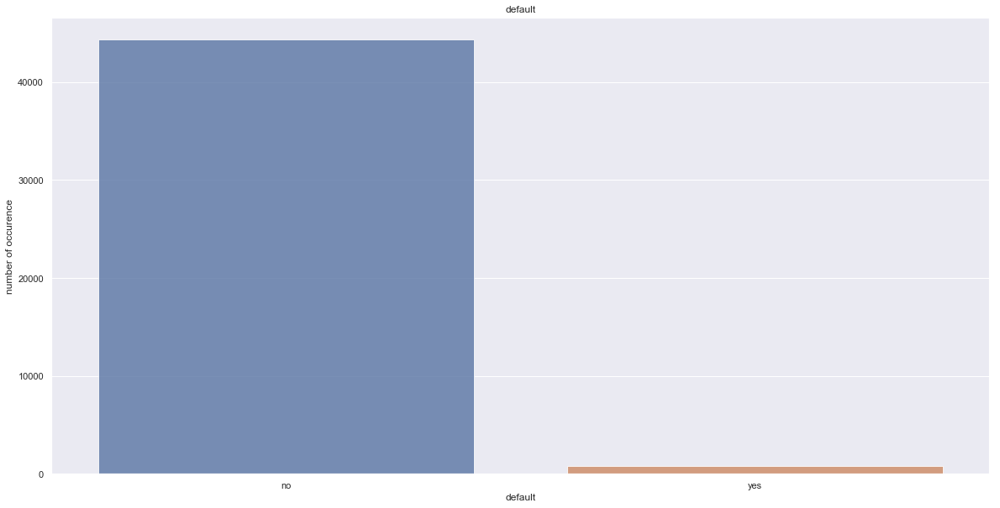

In [107]:
count_plot('default')

AxesSubplot(0.125,0.125;0.775x0.755)


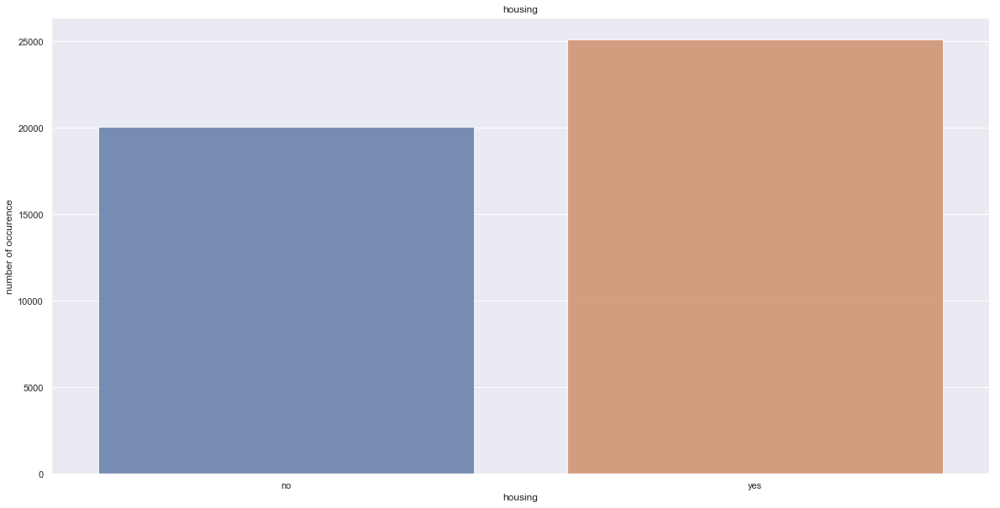

In [108]:
count_plot('housing')

AxesSubplot(0.125,0.125;0.775x0.755)


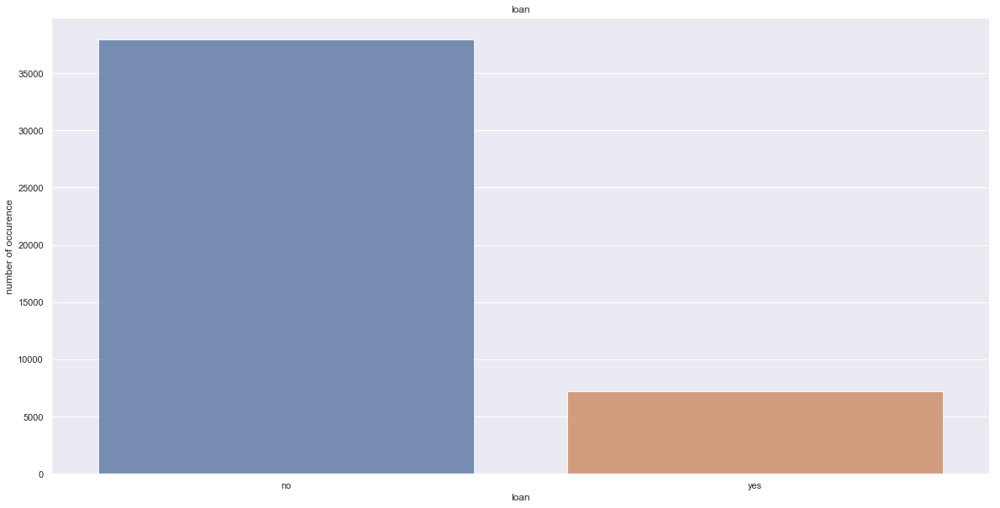

In [109]:
count_plot('loan')

AxesSubplot(0.125,0.125;0.775x0.755)


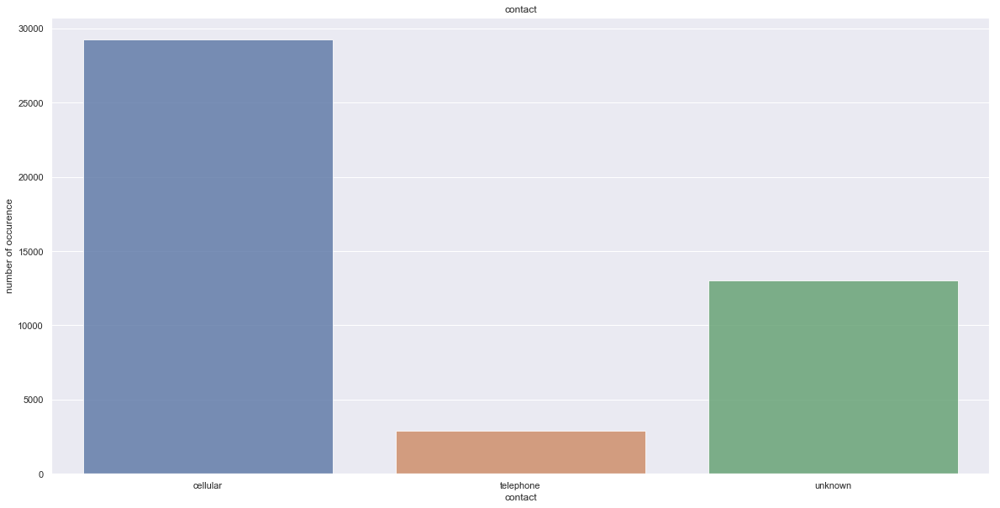

In [110]:
count_plot('contact')

In [197]:
train.contact.replace({'unknown':'digital'},inplace=True)

AxesSubplot(0.125,0.125;0.775x0.755)


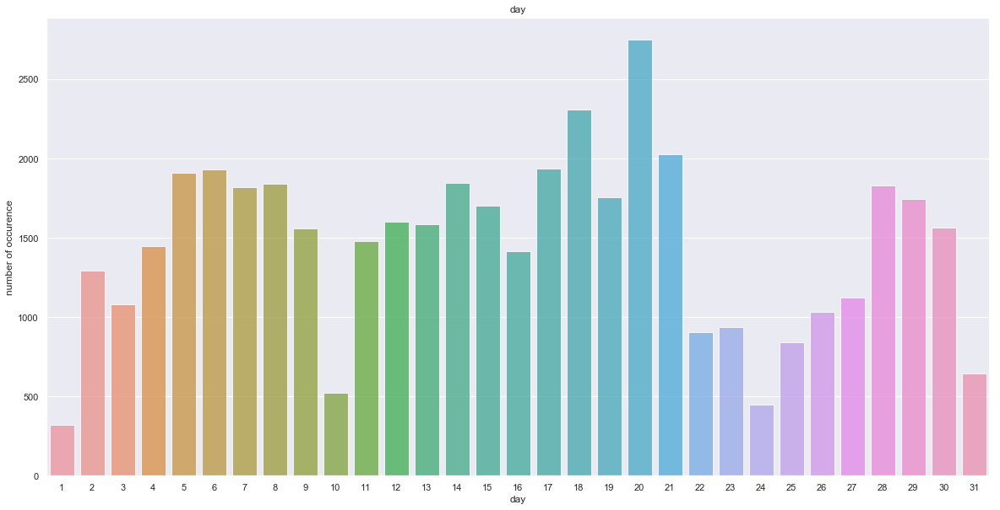

In [112]:
count_plot('day')

AxesSubplot(0.125,0.125;0.775x0.755)


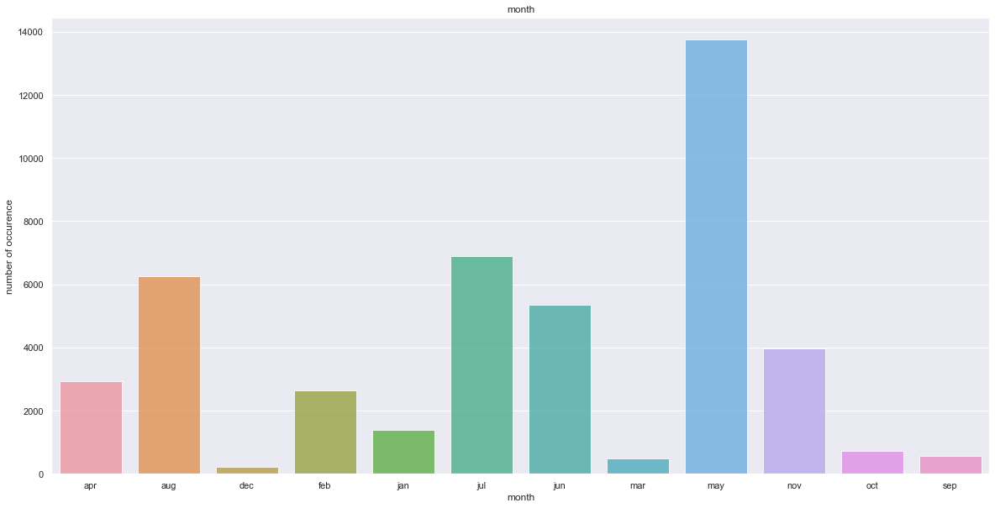

In [113]:
count_plot('month')

AxesSubplot(0.125,0.125;0.775x0.755)


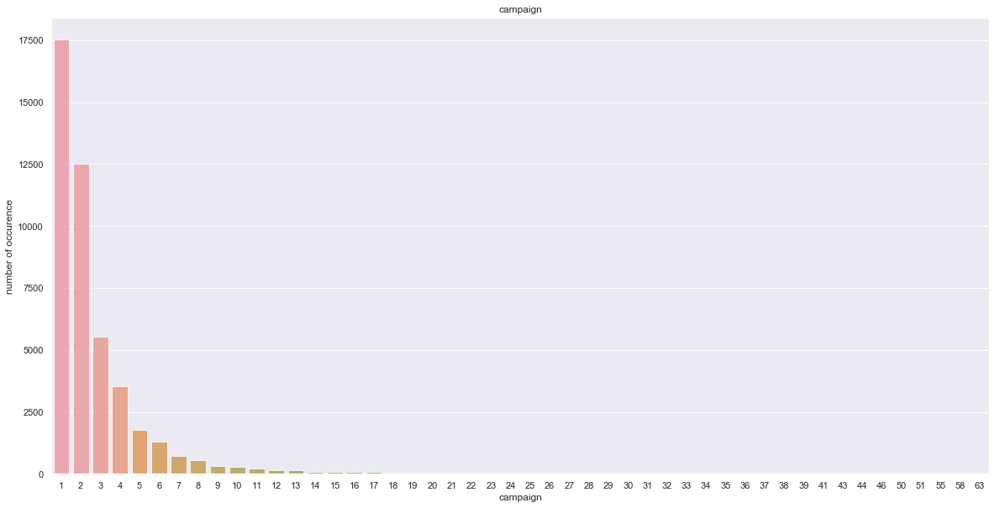

In [114]:
count_plot('campaign')

AxesSubplot(0.125,0.125;0.775x0.755)


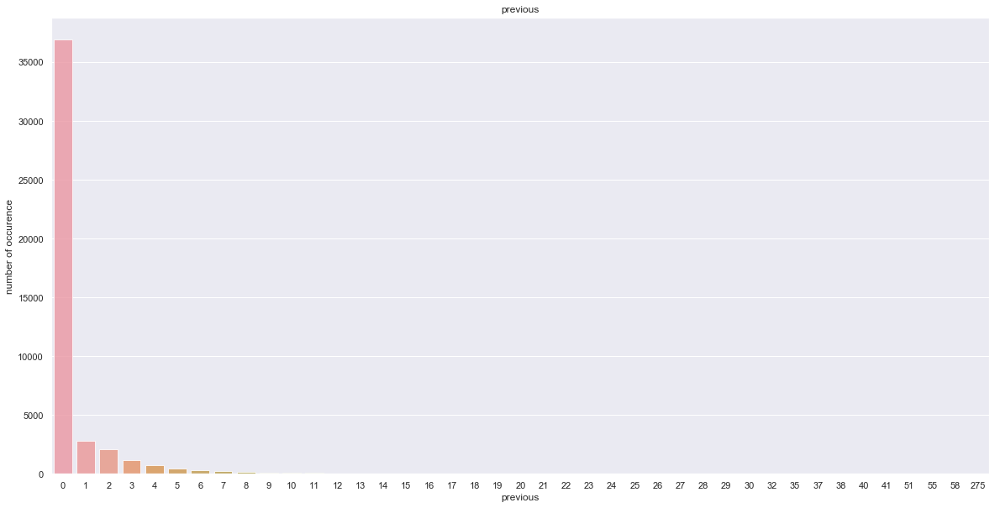

In [115]:
count_plot('previous')

AxesSubplot(0.125,0.125;0.775x0.755)


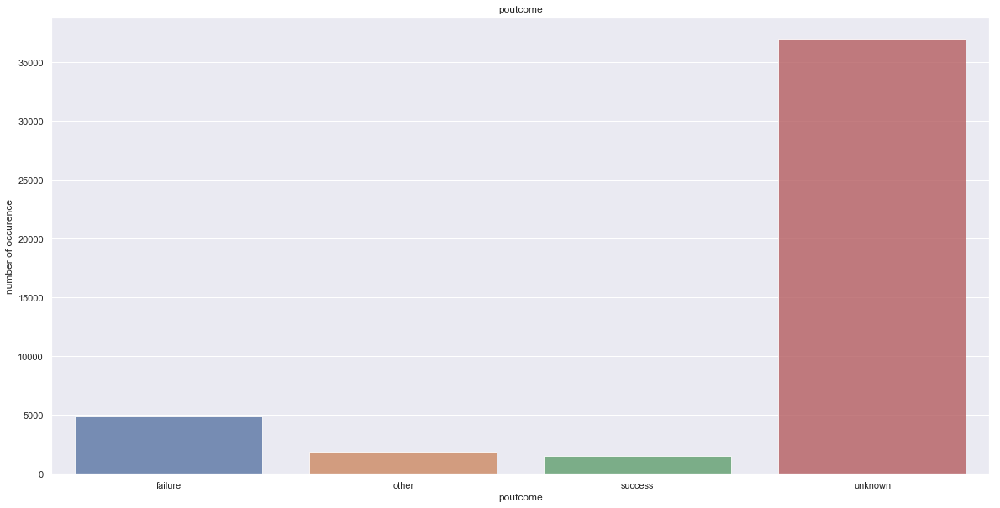

In [116]:
count_plot('poutcome')

In [117]:
train.shape[0]

45211

In [118]:
train[train.poutcome=='unknown'].shape[0]

36959

AxesSubplot(0.125,0.125;0.775x0.755)


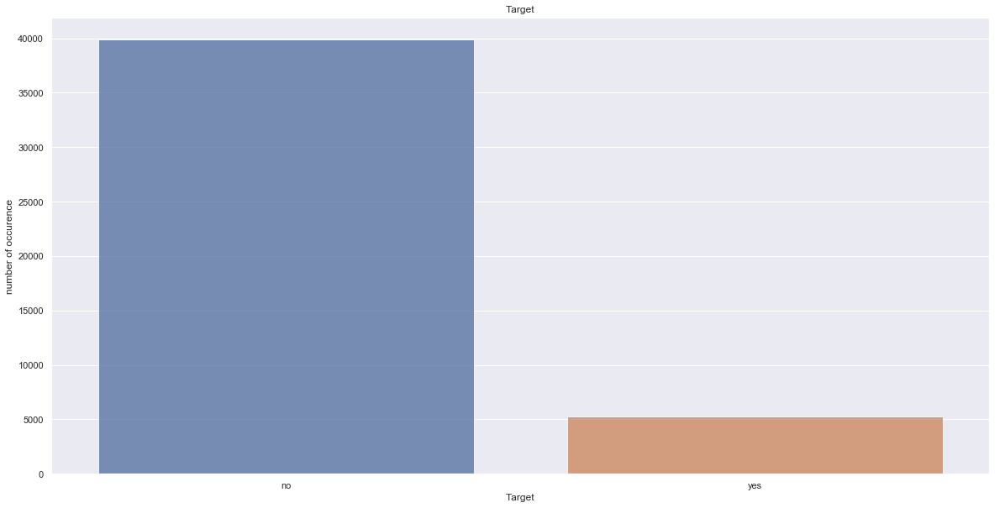

In [119]:
count_plot('Target')

In [198]:
def crosstab_bar(x,y):
    print(pd.crosstab(train[x],train[y]).plot(kind='bar'))

In [199]:
cat_col=train.select_dtypes('category').columns.values.tolist()

In [200]:
cat_col

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'month',
 'poutcome',
 'Target']

In [201]:
cat_col1=cat_col

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


/Users/himanshu/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


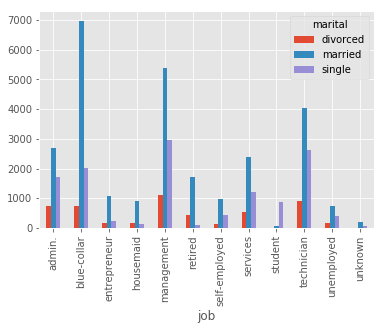

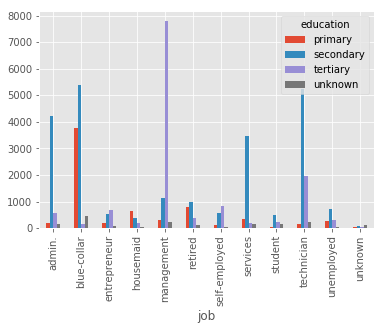

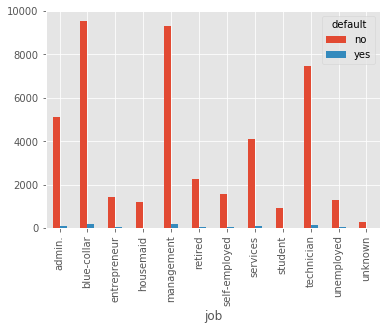

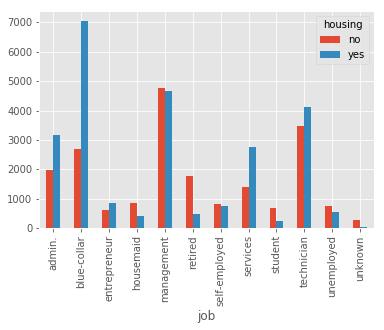

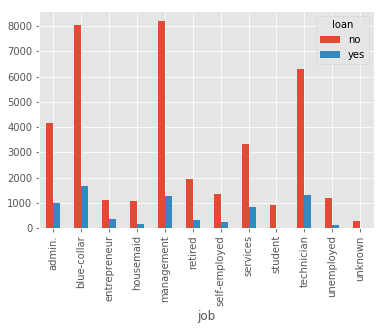

...

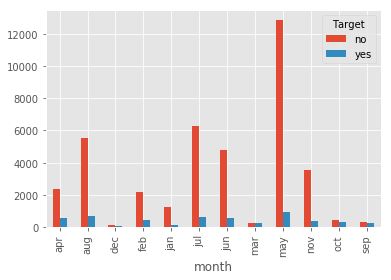

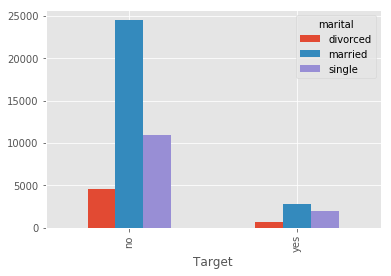

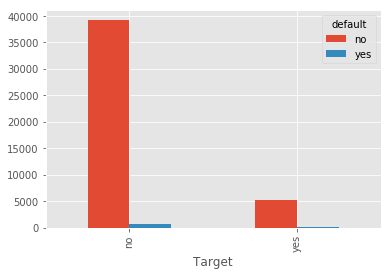

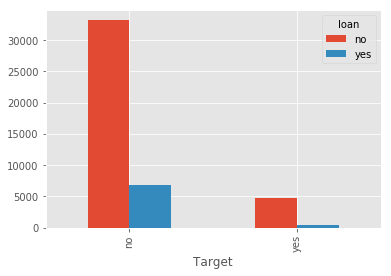

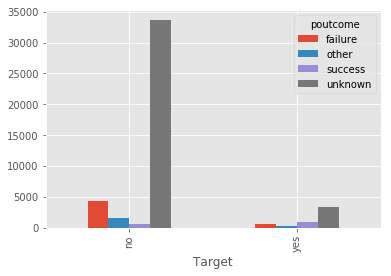

In [105]:
for i in cat_col:
    cat_col1.remove(i)
    for j in cat_col1:
        x=i
        crosstab_bar(x,j)
        

In [202]:
group=train.groupby('Target')['age','balance','duration','campaign','previous','day'].mean()

In [203]:
num_col=train.select_dtypes(include=['int64','float64']).columns.values.tolist()
group=train.groupby('Target')[num_col].mean()
def group_bar(y):
    #print(pd.crosstab(train[x],train[y]).plot(kind='bar'))
    print(sns.barplot(group.index,group[y].values))
    plt.ylabel(y)

AxesSubplot(0.125,0.125;0.775x0.755)


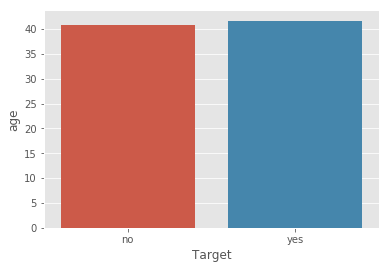

In [30]:
group_bar('age')

AxesSubplot(0.125,0.125;0.775x0.755)


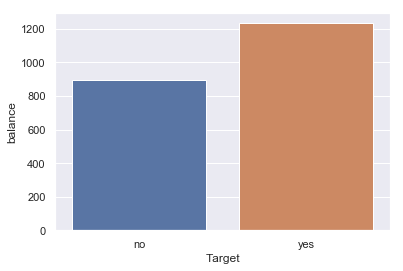

In [45]:
group_bar('balance')

AxesSubplot(0.125,0.125;0.775x0.755)


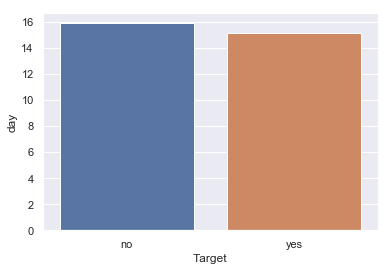

In [46]:
group_bar('day')

AxesSubplot(0.125,0.125;0.775x0.755)


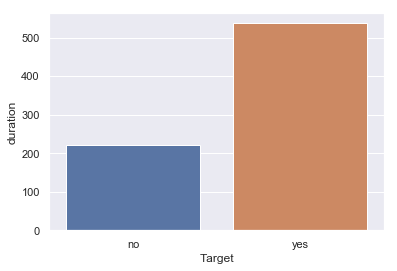

In [47]:
group_bar('duration')

AxesSubplot(0.125,0.125;0.775x0.755)


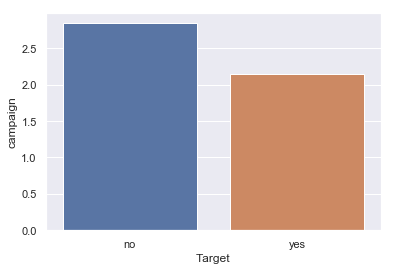

In [48]:
group_bar('campaign')

AxesSubplot(0.125,0.125;0.775x0.755)


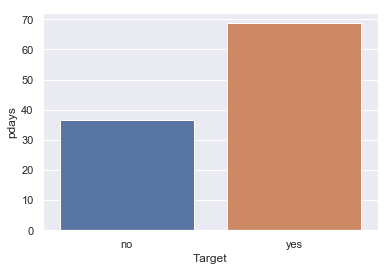

In [49]:
group_bar('pdays')

AxesSubplot(0.125,0.125;0.775x0.755)


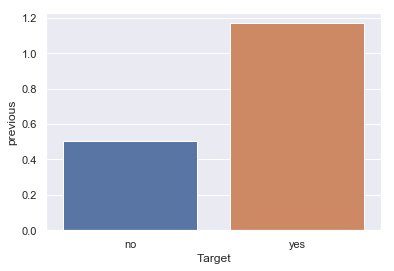

In [50]:
group_bar('previous')

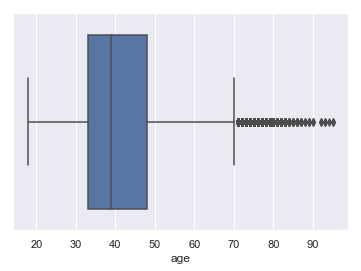

In [136]:
sns.boxplot(train.age)

In [204]:
def U_outlier(x):
    IQR=train[x].quantile(.75)-train[x].quantile(.25)
    U_Clip=train[x].quantile(.75) + (1.5 * IQR)
    train[x].clip_upper(U_Clip,inplace=True)
def L_outlier(x):
    IQR=train[x].quantile(.75)-train[x].quantile(.25)
    L_Clip=train[x].quantile(.25) - (1.5 * IQR)
    train[x].clip_lower(L_Clip,inplace=True)

In [205]:
U_outlier('age')

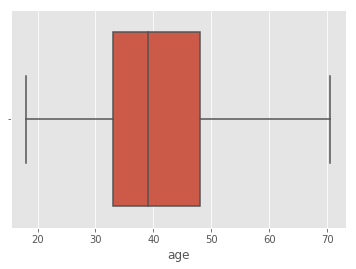

In [206]:
sns.boxplot(train.age)

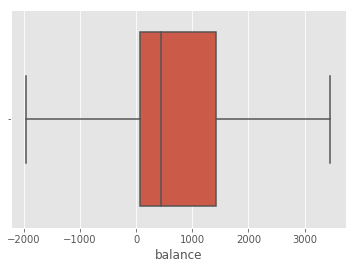

In [207]:
sns.boxplot(train.balance)

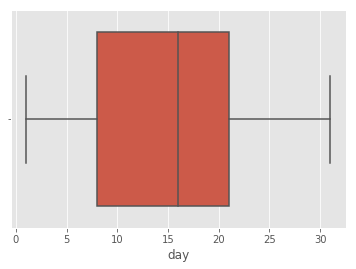

In [208]:
sns.boxplot(train.day)

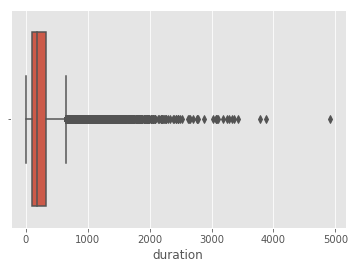

In [209]:
sns.boxplot(train.duration)

In [210]:
U_outlier('duration')

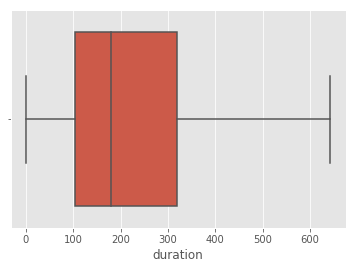

In [211]:
sns.boxplot(train.duration)

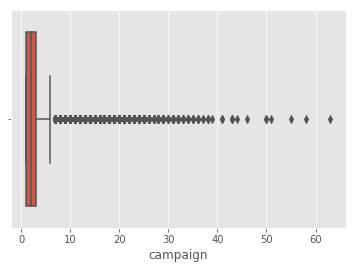

In [212]:
sns.boxplot(train.campaign)

In [213]:
U_outlier('campaign')

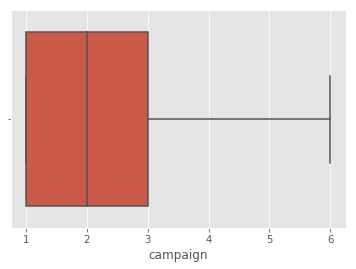

In [214]:
sns.boxplot(train.campaign)

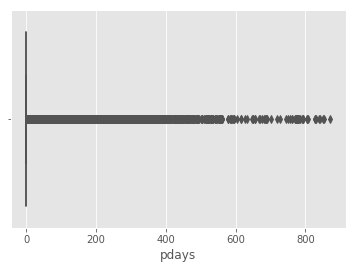

In [215]:
sns.boxplot(train.pdays)

In [216]:
U_outlier('pdays')

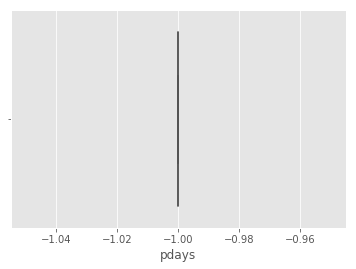

In [217]:
sns.boxplot(train.pdays)

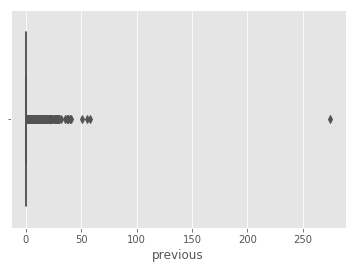

In [218]:
sns.boxplot(train.previous)

In [219]:
U_outlier('previous')

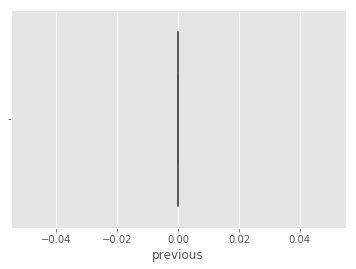

In [220]:
sns.boxplot(train.previous)

In [221]:
train1=train

In [222]:
job=pd.get_dummies(train.job,prefix='job')
train1=pd.concat([train1,job],axis=1)
train1.drop('job',axis=1,inplace=True)

In [223]:
train1.drop('job_unknown',axis=1,inplace=True)

In [224]:
marital=pd.get_dummies(train.marital,prefix='marital')
train1=pd.concat([train1,marital],axis=1)
train1.drop('marital',axis=1,inplace=True)

In [225]:
train1.drop('marital_divorced',axis=1,inplace=True)

In [226]:
edu=pd.get_dummies(train.education,prefix='education')
train1=pd.concat([train1,edu],axis=1)
train1.drop('education',axis=1,inplace=True)

In [227]:
train1.drop('education_unknown',axis=1,inplace=True)

In [228]:
contact=pd.get_dummies(train.contact,prefix='contact')
train1=pd.concat([train1,contact],axis=1)
train1.drop('contact',axis=1,inplace=True)

In [229]:
train1.drop('contact_digital',axis=1,inplace=True)

In [230]:
month=pd.get_dummies(train.month,prefix='month')
train1=pd.concat([train1,month],axis=1)
train1.drop('month',axis=1,inplace=True)

In [231]:
train1.drop('month_dec',axis=1,inplace=True)

In [232]:
poutcome=pd.get_dummies(train.poutcome,prefix='poutcome')
train1=pd.concat([train1,poutcome],axis=1)
train1.drop('poutcome',axis=1,inplace=True)

In [233]:
train1.drop('poutcome_success',axis=1,inplace=True)

In [234]:
train1.default=train1.default.astype('object')
train1.housing=train1.housing.astype('object')
train1.loan=train1.loan.astype('object')
train1.Target=train1.Target.astype('object')

In [235]:
train1.default[train1.default=='no']=0
train1.default[train1.default=='yes']=1
train1.housing[train1.housing=='no']=0
train1.housing[train1.housing=='yes']=1
train1.loan[train1.loan=='no']=0
train1.loan[train1.loan=='yes']=1
train1.Target[train1.Target=='no']=0
train1.Target[train1.Target=='yes']=1

In [236]:
train1.columns.values

array(['age', 'balance', 'day', 'duration', 'campaign', 'pdays',
       'previous', 'default', 'housing', 'loan', 'Target',
       'marital_by_edu', 'balance_status', 'age_status',
       'campaing_status', 'based_on_target', 'job_admin.',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'marital_married', 'marital_single', 'education_primary',
       'education_secondary', 'education_tertiary', 'contact_cellular',
       'contact_telephone', 'month_apr', 'month_aug', 'month_feb',
       'month_jan', 'month_jul', 'month_jun', 'month_mar', 'month_may',
       'month_nov', 'month_oct', 'month_sep', 'poutcome_failure',
       'poutcome_other', 'poutcome_unknown'], dtype=object)

In [237]:
final=train1[['age', 'balance', 'day', 'duration', 'campaign', 'pdays',
       'previous', 'default', 'housing', 'loan', 'Target','job_admin.', 'job_blue-collar',
       'job_entrepreneur', 'job_housemaid', 'job_management',
       'job_retired', 'job_self-employed', 'job_services', 'job_student',
       'job_technician', 'job_unemployed', 'marital_married',
       'marital_single', 'education_primary', 'education_secondary',
       'education_tertiary', 'contact_cellular', 'contact_telephone',
       'month_apr', 'month_aug', 'month_feb', 'month_jan', 'month_jul',
       'month_jun', 'month_mar', 'month_may', 'month_nov', 'month_oct',
       'month_sep', 'poutcome_failure', 'poutcome_other',
       'poutcome_unknown']]

In [238]:
final.dtypes

age                    float64
balance                float64
day                      int64
duration               float64
campaign               float64
pdays                  float64
previous               float64
default                 object
housing                 object
loan                    object
Target                  object
job_admin.               uint8
job_blue-collar          uint8
job_entrepreneur         uint8
job_housemaid            uint8
job_management           uint8
job_retired              uint8
job_self-employed        uint8
job_services             uint8
job_student              uint8
job_technician           uint8
job_unemployed           uint8
marital_married          uint8
marital_single           uint8
education_primary        uint8
education_secondary      uint8
education_tertiary       uint8
contact_cellular         uint8
contact_telephone        uint8
month_apr                uint8
month_aug                uint8
month_feb                uint8
month_ja

In [239]:
obj=final.select_dtypes('object').columns.values.tolist()

In [240]:
final[obj]=final[obj].astype('int64')

In [241]:
def pairplot(x):
    
    sns.set(style="ticks")
    sns.barplot(final.Target,final[x], hue=final.default,palette="Set1")
    

## Variable(s) vs Target

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



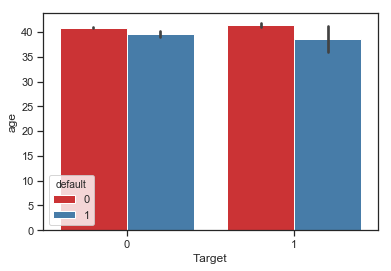

In [179]:
pairplot('age')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



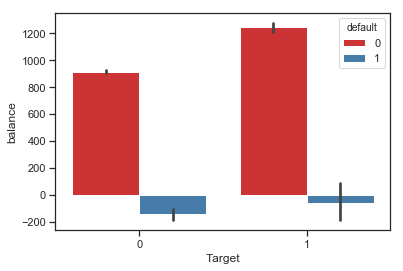

In [183]:
pairplot('balance')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



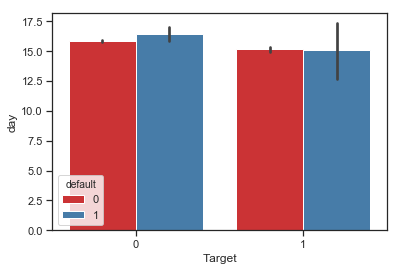

In [184]:
pairplot('day')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



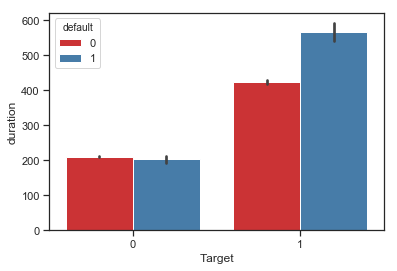

In [185]:
pairplot('duration')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



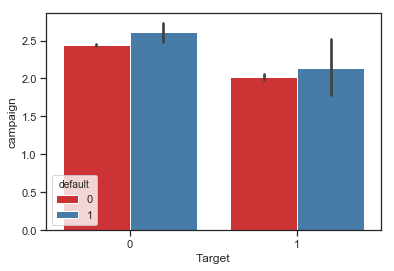

In [186]:
pairplot('campaign')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



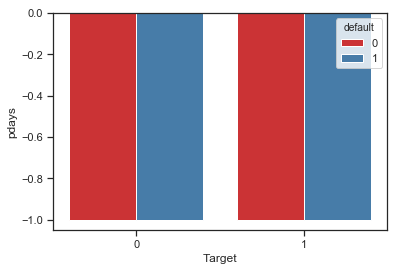

In [187]:
pairplot('pdays')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



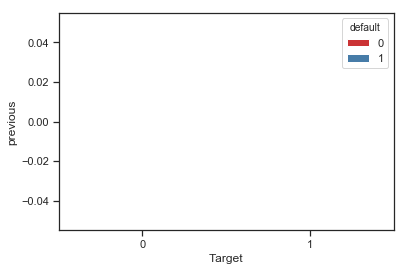

In [188]:
pairplot('previous')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



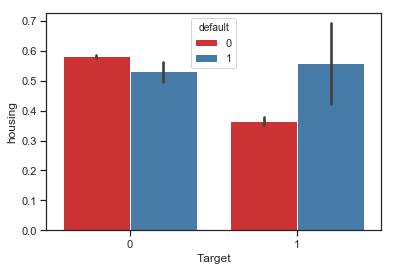

In [189]:
pairplot('housing')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



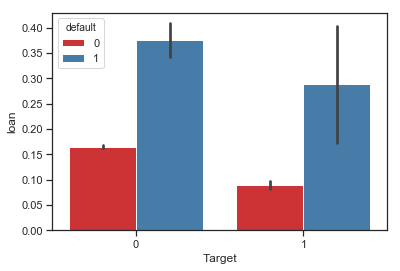

In [190]:
pairplot('loan')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



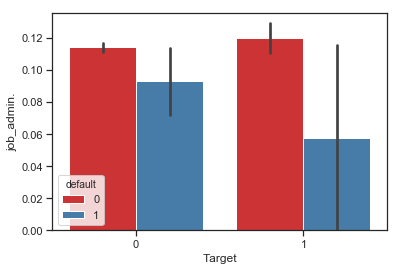

In [191]:
pairplot('job_admin.')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



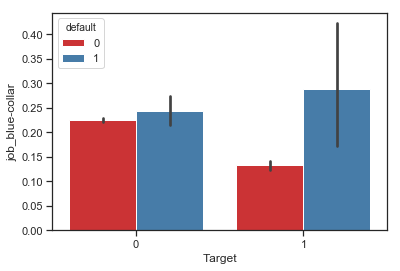

In [192]:
pairplot('job_blue-collar')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



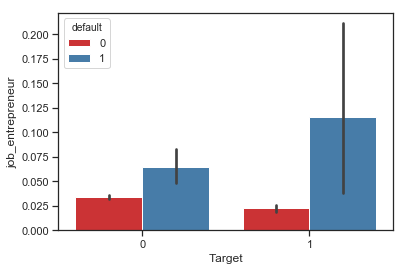

In [193]:
pairplot('job_entrepreneur')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



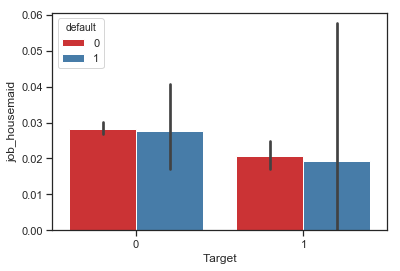

In [194]:
pairplot('job_housemaid')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



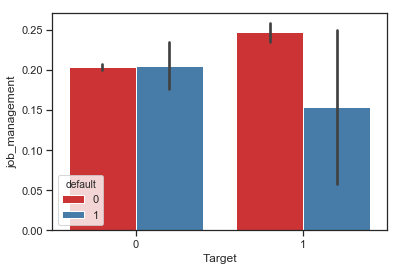

In [195]:
pairplot('job_management')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



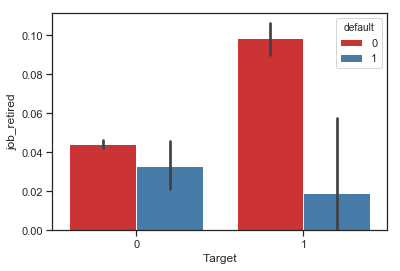

In [196]:
pairplot('job_retired')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



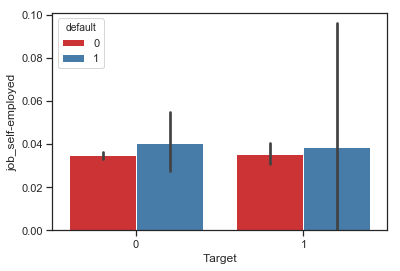

In [198]:
pairplot('job_self-employed')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



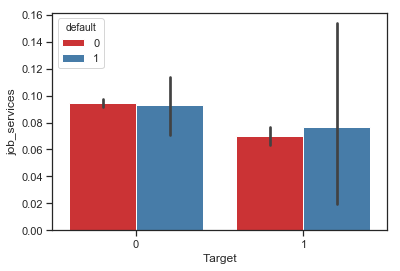

In [199]:
pairplot('job_services')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



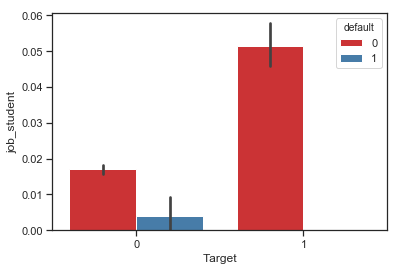

In [200]:
pairplot('job_student')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



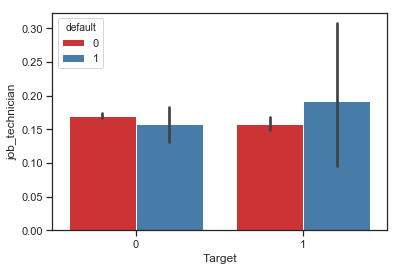

In [201]:
pairplot('job_technician')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



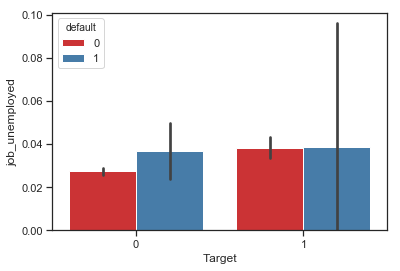

In [202]:
pairplot('job_unemployed')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



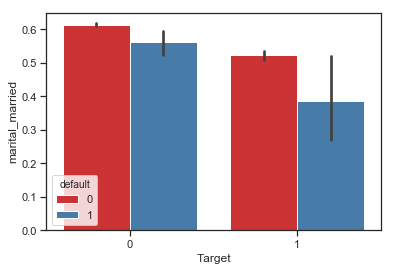

In [203]:
pairplot('marital_married')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



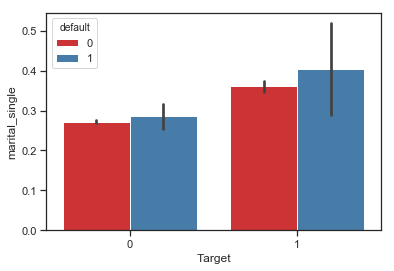

In [204]:
pairplot('marital_single')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



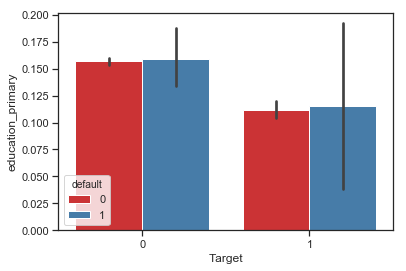

In [205]:
pairplot('education_primary')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



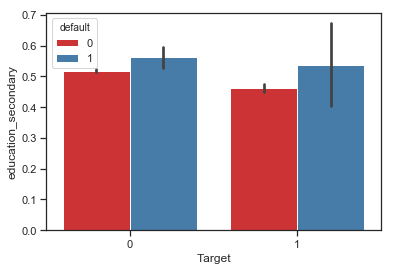

In [206]:
pairplot('education_secondary')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



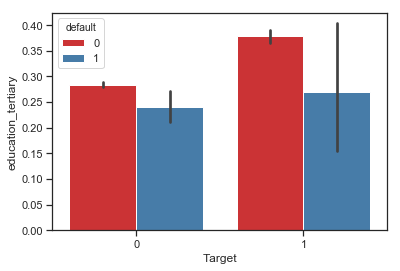

In [207]:
pairplot('education_tertiary')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



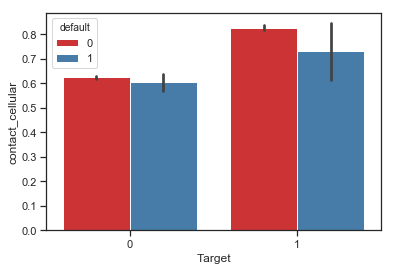

In [208]:
pairplot('contact_cellular')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



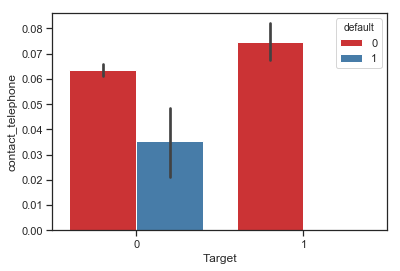

In [209]:
pairplot('contact_telephone')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



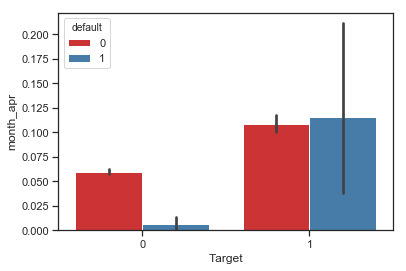

In [210]:
pairplot('month_apr')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



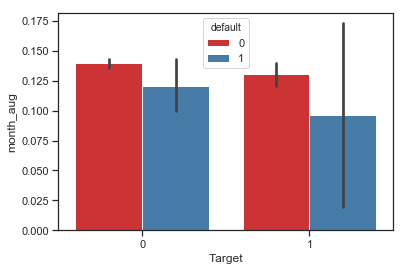

In [211]:
pairplot('month_aug')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



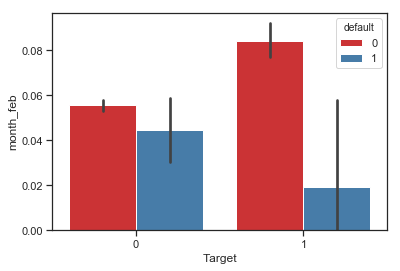

In [212]:
pairplot('month_feb')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



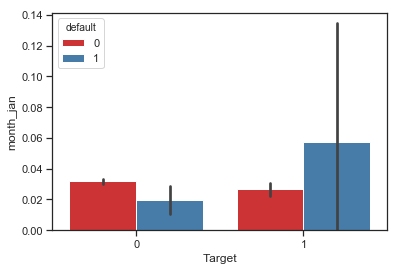

In [213]:
pairplot('month_jan')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



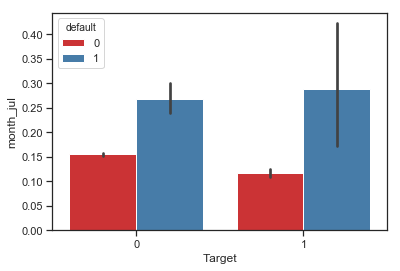

In [214]:
pairplot('month_jul')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



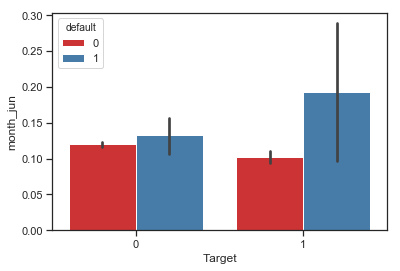

In [215]:
pairplot('month_jun')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



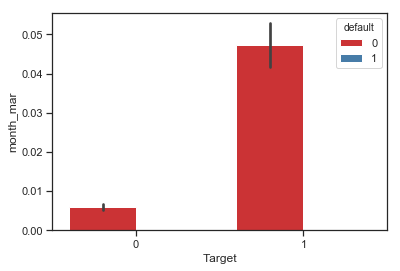

In [216]:
pairplot('month_mar')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



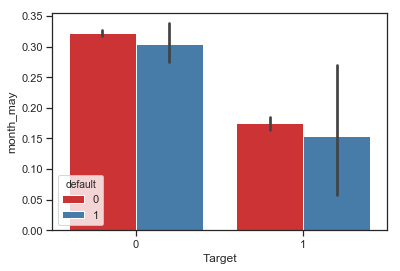

In [217]:
pairplot('month_may')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



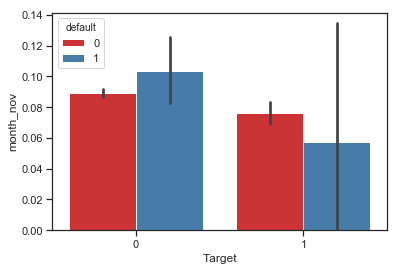

In [218]:
pairplot('month_nov')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



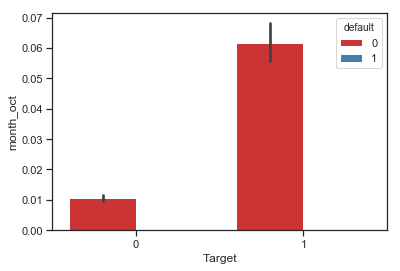

In [219]:
pairplot('month_oct')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



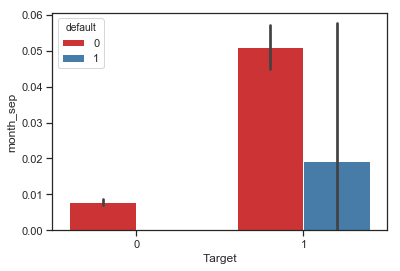

In [220]:
pairplot('month_sep')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



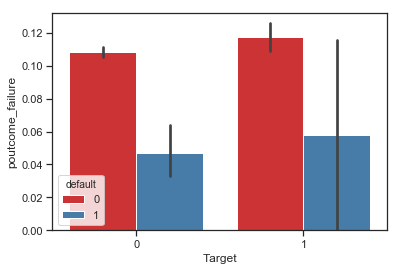

In [221]:
pairplot('poutcome_failure')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



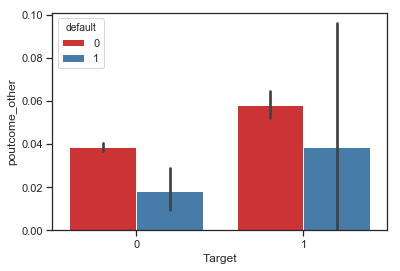

In [222]:
pairplot('poutcome_other')

/Users/himanshu/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



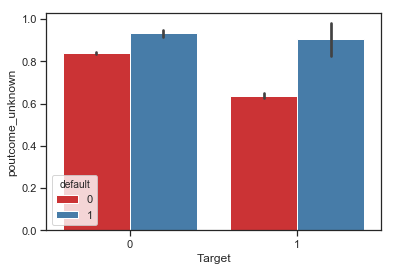

In [223]:
pairplot('poutcome_unknown')

Poutcome_other, month_sep, month_oct , month_may , month_march, month_june, month_feb, contact_telephone, education_tertiary , maarital_married, job_student, job_retired, job_entrepreneure ,job_management, loan, duration have more significant on target

## Hypothesis Test

In [242]:
def hypo_test(x):
    group_0=train1[x][train1.Target==0]
    group_1=train1[x][train1.Target==1]
    u,p_val=mannwhitneyu(group_0,group_1)
    print('p-value',p_val)
    if(p_val>.05):
        print('We accept the null hypothesis for', x ,'and hence the result is non-significant')
    else:
        print('We reject the null hypothesis for ', x)
    print(levene(group_0,group_1))

In [58]:
hypo_test('age')

p-value 0.031465401682601146
We reject the null hypothesis for  age
LeveneResult(statistic=549.2842499033429, pvalue=9.486176548329547e-121)


In [59]:
hypo_test('balance')

p-value 4.6154764573719855e-102
We reject the null hypothesis for  balance
LeveneResult(statistic=160.076098882573, pvalue=1.25655441219261e-36)


In [60]:
hypo_test('day')

p-value 1.6630393167944684e-10
We reject the null hypothesis for  day
LeveneResult(statistic=5.6196985501113135, pvalue=0.017763872603421944)


In [61]:
hypo_test('duration')

p-value 0.0
We reject the null hypothesis for  duration
LeveneResult(statistic=1295.2833785307455, pvalue=1.092173748502438e-279)


In [62]:
hypo_test('campaign')

p-value 3.688014327595975e-71
We reject the null hypothesis for  campaign
LeveneResult(statistic=139.839672537076, pvalue=3.2196526005286895e-32)


In [145]:
def unichitest(x):
    power,p_val=chisquare(train1[x].value_counts())
    print(p_val)
    if(p_val>.05):
        print('We accept the null hypothesis for', x ,'and hence the result is non-significant')
    else:
        print('We reject the null hypothesis for ', x)

In [64]:
unichitest('default')

0.0
We reject the null hypothesis for  default


In [65]:
unichitest('housing')

1.219719721387039e-124
We reject the null hypothesis for  housing


In [66]:
unichitest('loan')

0.0
We reject the null hypothesis for  loan


In [67]:
unichitest('Target')

0.0
We reject the null hypothesis for  Target


In [68]:
obs=final.select_dtypes(include='uint8').columns.values.tolist()
for i in obs:
    unichitest(i)

0.0
We reject the null hypothesis for  job_admin.
0.0
We reject the null hypothesis for  job_blue-collar
0.0
We reject the null hypothesis for  job_entrepreneur
0.0
We reject the null hypothesis for  job_housemaid
0.0
We reject the null hypothesis for  job_management
0.0
We reject the null hypothesis for  job_retired
0.0
We reject the null hypothesis for  job_self-employed
0.0
We reject the null hypothesis for  job_services
0.0
We reject the null hypothesis for  job_student
0.0
We reject the null hypothesis for  job_technician
0.0
We reject the null hypothesis for  job_unemployed
0.0
We reject the null hypothesis for  marital_married
0.0
We reject the null hypothesis for  marital_single
0.0
We reject the null hypothesis for  education_primary
2.0148968631831002e-08
We reject the null hypothesis for  education_secondary
0.0
We reject the null hypothesis for  education_tertiary
0.0
We reject the null hypothesis for  contact_cellular
0.0
We reject the null hypothesis for  contact_telephon

In [146]:
def bichitest( x):
    cont_table=pd.crosstab(final[x],final.Target)
    stat, p_val, dof, expected=chi2_contingency(cont_table)
    print('P-value is:',p_val)
    if(p_val>.05):
        print('We accept the null hypothesis for', x ,'&','Target','and hence the result is non-significant')
    else:
        print('We reject the null hypothesis for ', x,'&','Target')

In [70]:
bichitest('default')

P-value is: 2.4538606753508344e-06
We reject the null hypothesis for  default & Target


In [71]:
bichitest('housing')

P-value is: 2.918797605076633e-192
We reject the null hypothesis for  housing & Target


In [72]:
bichitest('loan')

P-value is: 1.665061163492756e-47
We reject the null hypothesis for  loan & Target


In [73]:
obs=final.select_dtypes(include='uint8').columns.values.tolist()
for i in obs:
    bichitest(i)

P-value is: 0.23971488052972273
We accept the null hypothesis for job_admin. & Target and hence the result is non-significant
P-value is: 6.642771608844445e-53
We reject the null hypothesis for  job_blue-collar & Target
P-value is: 3.4768454395721296e-05
We reject the null hypothesis for  job_entrepreneur & Target
P-value is: 0.001442204124289661
We reject the null hypothesis for  job_housemaid & Target
P-value is: 2.9206095358153636e-12
We reject the null hypothesis for  job_management & Target
P-value is: 1.8542421407036778e-63
We reject the null hypothesis for  job_retired & Target
P-value is: 0.8871178039606248
We accept the null hypothesis for job_self-employed & Target and hence the result is non-significant
P-value is: 3.6493904008252236e-09
We reject the null hypothesis for  job_services & Target
P-value is: 1.0000927792238278e-59
We reject the null hypothesis for  job_student & Target
P-value is: 0.059069878002821444
We accept the null hypothesis for job_technician & Target an

**** Variables not to use in model : ****

job_admin

month_jan

month_aug

job_technician

job_self-employed


In [243]:
not_include=['job_admin.',
'month_jan',
'month_aug',
'job_technician',
'job_self-employed']
cols=final.columns.values.tolist()

In [244]:
cols_f=[]
for i in cols:
    for j in not_include:
        if(i not in j):
            cols_f.append(i)

In [ ]:
sns.heatmap(final_data,annot=True)

In [245]:
final_cols=['Target', 'age', 'balance', 'campaign', 'contact_cellular',
       'contact_telephone', 'day', 'default', 'duration',
       'education_primary', 'education_secondary', 'education_tertiary',
       'housing','job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired','job_services', 'job_student','job_unemployed', 'loan', 'marital_married',
       'marital_single','month_apr','month_feb','month_jul', 'month_jun', 'month_mar', 'month_may',
       'month_nov', 'month_oct', 'month_sep', 'poutcome_failure',
       'poutcome_other', 'poutcome_unknown']

In [246]:
final_data=final[final_cols]

In [247]:
classifier=DTC

In [248]:
def print_result(headline,true_value,pred):
    print(headline)
    print('accuracy: {}'.format(accuracy_score(true_value,pred)))
    print('precision: {}'.format(precision_score(true_value,pred)))
    print('recall: {}'.format(recall_score(true_value,pred)))
    print('f1: {}'.format(f1_score(true_value,pred)))
    

In [249]:
X_Labels=['age', 'balance', 'campaign', 'contact_cellular',
       'contact_telephone', 'day', 'default', 'duration',
       'education_primary', 'education_secondary', 'education_tertiary',
       'housing','job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired','job_services', 'job_student','job_unemployed', 'loan', 'marital_married',
       'marital_single','month_apr','month_feb','month_jul', 'month_jun', 'month_mar', 'month_may',
       'month_nov', 'month_oct', 'month_sep', 'poutcome_failure',
       'poutcome_other', 'poutcome_unknown']
y_Label=['Target']

In [250]:
X_train,X_test,y_train,y_test=tts(final_data[X_Labels],final_data[y_Label],test_size=.3,random_state=0)

In [155]:
pipeline=make_pipeline(classifier(random_state=42))
model=pipeline.fit(X_train,y_train)
prediction=model.predict(X_test)

In [156]:
smote_pipeline=make_pipeline_imb(SMOTE(random_state=42),classifier(random_state=42))
smote_model=smote_pipeline.fit(X_train,y_train)
smote_predict=smote_model.predict(X_test)

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [157]:
print_result('SMOTE_CLassification',y_test,smote_predict)

SMOTE_CLassification
accuracy: 0.8658950162194043
precision: 0.43577981651376146
recall: 0.47648902821316613
f1: 0.4552261156034741


In [158]:
print_result('SMOTE_CLassification',y_test,smote_predict)

SMOTE_CLassification
accuracy: 0.8658950162194043
precision: 0.43577981651376146
recall: 0.47648902821316613
f1: 0.4552261156034741


In [290]:
dt_model=DTC()
def feature_selection(n):
    dtmodel=DTC(max_depth= 20, min_samples_split= 86,random_state=42)
    smote=SMOTE()
    x,y=smote.fit_sample(X_train,y_train)
    x=pd.DataFrame(x,columns=X_train.columns.values.tolist())
    y=pd.DataFrame(y,columns=['Target'])
    x1,y1=smote.fit_sample(X_test,y_test)
    x1=pd.DataFrame(x1,columns=X_test.columns.values.tolist())
    y1=pd.DataFrame(y1,columns=['Target'])
    #smote_model=smote_pipeline.fit(X_train,y_train)
    #smote_predict=smote_model.predict(X_test)
    #fit=RFE(smote_pipeline.fit(X_train,y_train),n)
    rfe=RFE(dtmodel,n)
    fit=rfe.fit(x,y)
    #print("Num Features: %s" % (fit.n_features_))
    #print("Selected Features: %s" % (fit.support_))
    #print("Feature Ranking: %s" % (fit.ranking_))
    s_colname=X_train.columns[fit.support_==True].values
    xtrain=x[s_colname]
    xtest=x1[s_colname]
    dtmodel=dtmodel.fit(xtrain,y)
    train_p=dtmodel.predict(xtrain)
    headline='train predict'
    print(n)
    print_result(headline,y,train_p)
    test_p=dtmodel.predict(xtest)
    headline='test predict'
    print_result(headline,y1,test_p)


In [83]:
feature_selection(2)

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



2
train predict
accuracy: 0.8651307551962222
precision: 0.8704315319565927
recall: 0.8579758880978786
f1: 0.8641588296760709
test predict
accuracy: 0.850781184727212
precision: 0.8554135274697368
recall: 0.8442643495697217
f1: 0.849802371541502


In [86]:
x=range(1,37,2)
for i in x:
    feature_selection(i)

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



1
train predict
accuracy: 0.7703287661431689
precision: 0.7603445305770887
recall: 0.7895038099667299
f1: 0.7746498648601214
test predict
accuracy: 0.7589188737572061
precision: 0.7520741825280625
recall: 0.7724956136686439
f1: 0.7621481267773977


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



3
train predict
accuracy: 0.8773119164311522
precision: 0.8847304297074488
recall: 0.8676707330161342
f1: 0.8761175429407408
test predict
accuracy: 0.8588854540897318
precision: 0.8656678300842768
recall: 0.8496114963656112
f1: 0.8575645134086693


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



5
train predict
accuracy: 0.9149822917039316
precision: 0.9300437458293171
recall: 0.8974707544807355
f1: 0.9134669652447794
test predict
accuracy: 0.8999498704987885
precision: 0.9143153886100052
recall: 0.882613417996491
f1: 0.8981847553458318


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



7
train predict
accuracy: 0.9192930991306837
precision: 0.9302206071284367
recall: 0.9065932100311237
f1: 0.9182549460105806
test predict
accuracy: 0.9021639234689615
precision: 0.9147066425432928
recall: 0.8870415239368368
f1: 0.9006616898540889


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



9
train predict
accuracy: 0.9341931098629843
precision: 0.9424717462632155
recall: 0.9248381211319
f1: 0.9335716736182583
test predict
accuracy: 0.9054223410477066
precision: 0.925769939457752
recall: 0.881527278803576
f1: 0.9031070786613028


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



11
train predict
accuracy: 0.9357850677923658
precision: 0.948525350712471
recall: 0.9215826566021537
f1: 0.9348599216141676
test predict
accuracy: 0.9155317904586849
precision: 0.930941859457586
recall: 0.8976522683599298
f1: 0.913994045087197


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



13
train predict
accuracy: 0.9402568597288306
precision: 0.9453874271651406
recall: 0.9344971917146639
f1: 0.9399107656879678
test predict
accuracy: 0.9135266104102264
precision: 0.9265707144703956
recall: 0.8982371125407302
f1: 0.9121839470558291


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



15
train predict
accuracy: 0.9435838729295604
precision: 0.9488506787330316
recall: 0.9377168819089186
f1: 0.9432509266256432
test predict
accuracy: 0.9156571142117136
precision: 0.9298427509936064
recall: 0.8991561533962737
f1: 0.9142420252304294


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



17
train predict
accuracy: 0.9420634636711623
precision: 0.948562509075069
recall: 0.9348191607340893
f1: 0.9416406911587178
test predict
accuracy: 0.9188737572061157
precision: 0.930454194213102
recall: 0.9054223410477066
f1: 0.9177676151761517


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



19
train predict
accuracy: 0.9424748685293171
precision: 0.9474045939591246
recall: 0.9369656208635925
f1: 0.942156192668801
test predict
accuracy: 0.9179547163505724
precision: 0.9282595668179094
recall: 0.9059236360598212
f1: 0.9169556025369979


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



21
train predict
accuracy: 0.9455514613816048
precision: 0.9518885381517361
recall: 0.9385396916252281
f1: 0.9451669849047087
test predict
accuracy: 0.9176622942601721
precision: 0.9325142758262676
recall: 0.900492940095246
f1: 0.9162239129510774


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



23
train predict
accuracy: 0.9456766715558258
precision: 0.9472928335487577
recall: 0.9438700676134941
f1: 0.9455783531941582
test predict
accuracy: 0.916952126326343
precision: 0.9241818954526136
recall: 0.9084301111203944
f1: 0.9162383079126991


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



25
train predict
accuracy: 0.9438700676134941
precision: 0.944792973651192
recall: 0.9428326118842343
f1: 0.9438117748173614
test predict
accuracy: 0.9179129417662294
precision: 0.9249065579340808
recall: 0.9096833486506809
f1: 0.9172317931005433


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



27
train predict
accuracy: 0.9441026007941903
precision: 0.9539935634874196
recall: 0.9332093156369621
f1: 0.9434869884442195
test predict
accuracy: 0.9203358676581168
precision: 0.9354336160637009
recall: 0.9029994151558192
f1: 0.9189304085363261


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



29
train predict
accuracy: 0.94388795478124
precision: 0.9512
recall: 0.9357850677923658
f1: 0.943429570988044
test predict
accuracy: 0.916952126326343
precision: 0.9293641916888927
recall: 0.9024981201437046
f1: 0.9157341471685317


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



31
train predict
accuracy: 0.9465710299431188
precision: 0.9522826086956522
recall: 0.9402568597288306
f1: 0.9462315266502259
test predict
accuracy: 0.9196256997242878
precision: 0.9305615087869695
recall: 0.9069262260840505
f1: 0.9185918591859187


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



33
train predict
accuracy: 0.9438342932780024
precision: 0.9509322865554465
recall: 0.9359639394698244
f1: 0.9433887426531569
test predict
accuracy: 0.9183306876096583
precision: 0.9317868230424284
recall: 0.9027487676497619
f1: 0.9170379800551665


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



35
train predict
accuracy: 0.9445676671555826
precision: 0.9517594881489021
recall: 0.9366078775086752
f1: 0.944122897170985
test predict
accuracy: 0.9190408555434874
precision: 0.9327064101458028
recall: 0.9032500626618765
f1: 0.9177419354838711


In [85]:
param_grid={'max_depth':[5,10,20,40,60,80],'min_samples_split':range(10,100,2)}
dtmodel=DTC()
clf=GridSearchCV(dtmodel,param_grid,cv=5,scoring='f1_macro')
clf.fit(X_train,y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': [5, 10, 20, 40, 60, 80], 'min_samples_split': range(10, 100, 2)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_macro', verbose=0)

In [87]:
clf.best_params_

{'max_depth': 20, 'min_samples_split': 86}

In [252]:
def feature_selection1(n):
    dtmodel=DTC(max_depth= 20, min_samples_split= 86,random_state=42)
    smote=SMOTE()
    x,y=smote.fit_sample(X_train,y_train)
    x=pd.DataFrame(x,columns=X_train.columns.values.tolist())
    y=pd.DataFrame(y,columns=['Target'])
    #smote_model=smote_pipeline.fit(X_train,y_train)
    #smote_predict=smote_model.predict(X_test)
    #fit=RFE(smote_pipeline.fit(X_train,y_train),n)
    rfe=RFE(dtmodel,n)
    fit=rfe.fit(x,y)
    #print("Num Features: %s" % (fit.n_features_))
    #print("Selected Features: %s" % (fit.support_))
    #print("Feature Ranking: %s" % (fit.ranking_))
    s_colname=X_train.columns[fit.support_==True].values
    print(s_colname)
    #xtrain=x[s_colname]
    #xtest=X_test[s_colname]
    #dtmodel=dtmodel.fit(xtrain,y)
    #train_p=dtmodel.predict(xtrain)
    #headline='train predict'
    #print(n)
    #print_result(headline,y,train_p)
    #test_p=dtmodel.predict(xtest)
    #headline='test predict'
    #print_result(headline,y_test,test_p)



In [253]:
def model_making(n):
    dtmodel=DTC(max_depth= 20, min_samples_split= 86,random_state=42)
    smote=SMOTE()
    x,y=smote.fit_sample(X_train,y_train)
    x=pd.DataFrame(x,columns=X_train.columns.values.tolist())
    y=pd.DataFrame(y,columns=['Target'])
    x1,y1=smote.fit_sample(X_test,y_test)
    x1=pd.DataFrame(x1,columns=X_test.columns.values.tolist())
    y1=pd.DataFrame(y1,columns=['Target'])
    rfe=RFE(dtmodel,n)
    fit=rfe.fit(x,y)
    s_colname=X_train.columns[fit.support_==True].values
    xtrain=x[s_colname]
    xtest=x1[s_colname]
    dtmodel=dtmodel.fit(xtrain,y)
    train_p=pd.DataFrame(dtmodel.predict_proba(xtrain))
    train_p.columns=['Zero_Prob','One_Prob']
    fpr,tpr,thresholds=metrics.roc_curve(y,train_p.One_Prob)
    plt.xlim([0.0,1.0])
    plt.ylim([0.0,1.0])
    plt.title('ROC Curve')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    print(plt.plot(fpr,tpr))
    plt.grid(True)
    trh=[.1,.15,.2,.25,.3,.35,.4,.45,.5,.55,.56,.57,.6,.7,.8,.9]
    evalualte=pd.Series()
    def eval_threshold(threshold):
        print('Sensitivity:',tpr[thresholds>threshold][-1])
        print('Specificity:',1-fpr[thresholds>threshold][-1])
    for i in trh:
        print(i,'\n',evalualte.append(eval_threshold(i)))
    #return evalualte     
    #headline='train predict'
    #print(n)
    #print_result(headline,y,train_p)
    #test_p=dtmodel.predict(xtest)
    #headline='test predict'
    #print_result(headline,y_test,test_p)


    
    

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Sensitivity: 0.990484026759203
Specificity: 0.7696132794333346
0.1 
 Series([], dtype: float64)
Sensitivity: 0.9835795800093013
Specificity: 0.8157979465531427
0.15 
 Series([], dtype: float64)
Sensitivity: 0.9762816155689908
Specificity: 0.8501055342897006
0.2 
 Series([], dtype: float64)
Sensitivity: 0.9694844918255643
Specificity: 0.8731799806818589
0.25 
 Series([], dtype: float64)
Sensitivity: 0.9628304654241048
Specificity: 0.8906020820663256
0.3 
 Series([], dtype: float64)
Sensitivity: 0.9515973240797052
Specificity: 0.9138554001359425
0.35 
 Series([], dtype: float64)
Sensitivity: 0.9441562622974278
Specificity: 0.926483740564519
0.4 
 Series([], dtype: float64)
Sensitivity: 0.9359997138053161
Specificity: 0.9374664615604765
0.45 
 Series([], dtype: float64)
Sensitivity: 0.9293456874038565
Specificity: 0.9446213286588202
0.5 
 Series([], dtype: float64)
Sensitivity: 0.9151075018781526
Specificity: 0.957213894751905
0.55 
 Series([], dtype: float64)
Sensitivity: 0.9127106214002

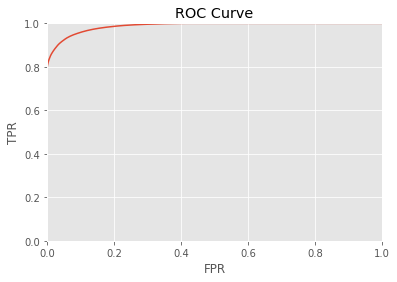

In [162]:

model_making(11)

## Decision Tree

In [163]:
dtmodel=DTC(max_depth= 20, min_samples_split= 86,random_state=42)
smote=SMOTE()
x,y=smote.fit_sample(X_train,y_train)
x=pd.DataFrame(x,columns=X_train.columns.values.tolist())
y=pd.DataFrame(y,columns=['Target'])
x1,y1=smote.fit_sample(X_test,y_test)
x1=pd.DataFrame(x1,columns=X_test.columns.values.tolist())
y1=pd.DataFrame(y1,columns=['Target'])
s_colname=['balance', 'contact_cellular', 'duration', 'housing', 'marital_married',
 'month_apr', 'month_feb', 'month_mar', 'poutcome_failure', 'poutcome_other',
 'poutcome_unknown']

xtrain=x[s_colname]
xtest=x1[s_colname]
dtmodel=dtmodel.fit(xtrain,y)
train_p=pd.DataFrame(dtmodel.predict_proba(xtrain))
train_p.columns=['Zero_Prob','One_Prob']
train_p['pred']=np.nan
train_p['pred'][train_p.One_Prob>=.45]=1
train_p['pred'][train_p.One_Prob<.45]=0
test_p=pd.DataFrame(dtmodel.predict_proba(xtest))
test_p.columns=['Zero_Prob','One_Prob']
test_p['pred']=np.nan
test_p['pred'][test_p.One_Prob>=.45]=1
test_p['pred'][test_p.One_Prob<.45]=0



/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [164]:
print_result('train',y,train_p.pred)


train
accuracy: 0.9364826673344543
precision: 0.935376819868684
recall: 0.9377526562444103
f1: 0.9365632313271522


In [165]:
print_result('test',y1,test_p.pred)

test
accuracy: 0.9055894393850781
precision: 0.9157317804230539
recall: 0.8933912607569555
f1: 0.9044235811553752


In [255]:
numeric_col=['age','balance','campaign','day','duration']
num_data=X_train[numeric_col]
scaler=StandardScaler()
train_X=pd.DataFrame(scaler.fit_transform(num_data),columns=numeric_col)
train_X.reset_index(inplace=True)
cols1=X_train.drop(numeric_col,axis=1).columns.values
categ=X_train[cols1]
categ.reset_index(inplace=True)
train1=pd.concat([train_X,categ],axis=1)

num_data1=X_test[numeric_col]
scaler=StandardScaler()
test_X=pd.DataFrame(scaler.fit_transform(num_data1),columns=numeric_col)
test_X.reset_index(inplace=True)
cols1=X_test.drop(numeric_col,axis=1).columns.values
categ1=X_test[cols1]
categ1.reset_index(inplace=True)
test1=pd.concat([test_X,categ1],axis=1)



/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



## Bagging Classifier

In [169]:
param_grid={'n_estimators':[1,2,3,4,5,6,7,8,9,10,20,40,60,80],'max_samples':range(10,100,1),'oob_score':[True,False],'bootstrap_features':[True,False]}
BCmodel=BC()
clf=GridSearchCV(BCmodel,param_grid,cv=5,scoring='f1_macro')
clf.fit(train1,y_train)
clf.best_params_

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/pytho

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/pytho

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being 

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d ar

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetri

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/me

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/en

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/him

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:610: UserWarning:

Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:615: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using r

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=BaggingClassifier(base_estimator=None, bootstrap=True,
         bootstrap_features=False, max_features=1.0, max_samples=1.0,
         n_estimators=10, n_jobs=None, oob_score=False, random_state=None,
         verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 40, 60, 80], 'max_samples': range(10, 100), 'oob_score': [True, False], 'bootstrap_features': [True, False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_macro', verbose=0)

In [170]:
clf.best_params_

{'bootstrap_features': False,
 'max_samples': 95,
 'n_estimators': 7,
 'oob_score': True}

In [171]:

bcmodel=BC(max_samples=95,n_estimators=7,oob_score=True)
smote=SMOTE()
x,y=smote.fit_sample(train1,y_train)
x=pd.DataFrame(x,columns=train1.columns.values.tolist())
y=pd.DataFrame(y,columns=['Target'])
x1,y1=smote.fit_sample(test1,y_test)
x1=pd.DataFrame(x1,columns=test1.columns.values.tolist())
y1=pd.DataFrame(y1,columns=['Target'])
s_colname=['balance', 'contact_cellular', 'duration', 'housing', 'marital_married',
 'month_apr', 'month_feb', 'month_mar', 'poutcome_failure', 'poutcome_other',
 'poutcome_unknown']
xtrain=x[s_colname]
xtest=x1[s_colname]
bcmodel=bcmodel.fit(xtrain,y)
train_p=pd.DataFrame(bcmodel.predict_proba(xtrain))
train_p.columns=['Zero_Prob','One_Prob']
train_p['pred']=np.nan
train_p['pred'][train_p.One_Prob>=.45]=1
train_p['pred'][train_p.One_Prob<.45]=0
test_p=pd.DataFrame(bcmodel.predict_proba(xtest))
test_p.columns=['Zero_Prob','One_Prob']
test_p['pred']=np.nan
test_p['pred'][test_p.One_Prob>=.45]=1
test_p['pred'][test_p.One_Prob<.45]=0


print_result('train',y,train_p.pred)
print_result('test',y1,test_p.pred)





/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/bagging.py:622: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



train
accuracy: 0.8619647265052052
precision: 0.8581339374203596
recall: 0.8673129896612171
f1: 0.8626990481273907
test
accuracy: 0.8477316400701813
precision: 0.8479933110367893
recall: 0.8473556688110954
f1: 0.8476743700112834


## Gradient Boosting

In [267]:
param_grid={'n_estimators':[10,20,30],'min_samples_split':range(2,8,2),'max_depth':range(2,10,2),'learning_rate':[.01,.05,.09,.1,.5,.9]}
GBCmodel=GradientBoostingClassifier()
clf=GridSearchCV(GBCmodel,param_grid,cv=5)
clf.fit(train1,y_train)


/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anac

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sampl...      subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [10, 20, 30], 'min_samples_split': range(2, 8, 2), 'max_depth': range(2, 10, 2), 'learning_rate': [0.01, 0.05, 0.09, 0.1, 0.5, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [268]:
clf.best_params_

{'learning_rate': 0.5,
 'max_depth': 4,
 'min_samples_split': 2,
 'n_estimators': 10}

In [270]:

gbcmodel=GradientBoostingClassifier(min_samples_split=2,n_estimators=10,max_depth=4,learning_rate=.5)
smote=SMOTE()
x,y=smote.fit_sample(train1,y_train)
x=pd.DataFrame(x,columns=train1.columns.values.tolist())
y=pd.DataFrame(y,columns=['Target'])
x1,y1=smote.fit_sample(test1,y_test)
x1=pd.DataFrame(x1,columns=test1.columns.values.tolist())
y1=pd.DataFrame(y1,columns=['Target'])
s_colname=['balance', 'contact_cellular', 'duration', 'housing', 'marital_married',
 'month_apr', 'month_feb', 'month_mar', 'poutcome_failure', 'poutcome_other',
 'poutcome_unknown']
xtrain=x[s_colname]
xtest=x1[s_colname]
gbcmodel=gbcmodel.fit(xtrain,y)
train_p=pd.DataFrame(gbcmodel.predict_proba(xtrain))
train_p.columns=['Zero_Prob','One_Prob']
train_p['pred']=np.nan
train_p['pred'][train_p.One_Prob>=.45]=1
train_p['pred'][train_p.One_Prob<.45]=0
test_p=pd.DataFrame(gbcmodel.predict_proba(xtest))
test_p.columns=['Zero_Prob','One_Prob']
test_p['pred']=np.nan
test_p['pred'][test_p.One_Prob>=.45]=1
test_p['pred'][test_p.One_Prob<.45]=0


print_result('train',y,train_p.pred)
print_result('test',y1,test_p.pred)






/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



train
accuracy: 0.9131756877615999
precision: 0.8976963603181709
recall: 0.9326369262690946
f1: 0.9148331403305611
test
accuracy: 0.8998663213301028
precision: 0.8896125040703354
recall: 0.9130253153981118
f1: 0.9011668659547274


##  Random Forest

In [286]:
param_grid={'n_estimators':[10,20,30,40],'min_samples_split':range(2,12,2),'max_features':range(2,11),'oob_score':[True,False]}
GBCmodel=RFC()
clf=GridSearchCV(GBCmodel,param_grid,cv=5)
clf.fit(train1,y_train)



/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encount

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encount

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encount

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encount

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exam

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himansh

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:458: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

divide by zero encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:463: RuntimeWarning:

invalid value encountered in true_divide

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for exa

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': [10, 20, 30, 40], 'min_samples_split': range(2, 12, 2), 'max_features': range(2, 11), 'oob_score': [True, False]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [287]:
clf.best_params_

{'max_features': 7,
 'min_samples_split': 10,
 'n_estimators': 40,
 'oob_score': True}

In [288]:

rcfmodel=RFC(min_samples_split=10,n_estimators=40,max_features=7,oob_score=True)
smote=SMOTE()
x,y=smote.fit_sample(train1,y_train)
x=pd.DataFrame(x,columns=train1.columns.values.tolist())
y=pd.DataFrame(y,columns=['Target'])
x1,y1=smote.fit_sample(test1,y_test)
x1=pd.DataFrame(x1,columns=test1.columns.values.tolist())
y1=pd.DataFrame(y1,columns=['Target'])
s_colname=['balance', 'contact_cellular', 'duration', 'housing', 'marital_married',
 'month_apr', 'month_feb', 'month_mar', 'poutcome_failure', 'poutcome_other',
 'poutcome_unknown']
xtrain=x[s_colname]
xtest=x1[s_colname]
rcfmodel=rcfmodel.fit(xtrain,y)
train_p=pd.DataFrame(rcfmodel.predict_proba(xtrain))
train_p.columns=['Zero_Prob','One_Prob']
train_p['pred']=np.nan
train_p['pred'][train_p.One_Prob>=.45]=1
train_p['pred'][train_p.One_Prob<.45]=0
test_p=pd.DataFrame(rcfmodel.predict_proba(xtest))
test_p.columns=['Zero_Prob','One_Prob']
test_p['pred']=np.nan
test_p['pred'][test_p.One_Prob>=.45]=1
test_p['pred'][test_p.One_Prob<.45]=0


print_result('train',y,train_p.pred)
print_result('test',y1,test_p.pred)







/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:761: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/himanshu/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



train
accuracy: 0.9622580760562373
precision: 0.956606240503198
recall: 0.9684470360963046
f1: 0.9624902225698642
test
accuracy: 0.9018297267942184
precision: 0.9005580078287666
recall: 0.9034171609992481
f1: 0.9019853186519854


## Accuracies by different model:

**** Decision Tree**** :

Train:94

Test:91

**** Bagging Classifier**** :

Train:86

Test:84

**** Gradient Boosting**** :

Train:91

Test:89

**** Random Forest**** :

Train:96

Test:91

All the models perform good on dataset , there is no overfitting or underfitting issues seen in the model. Hence, if have to select a model of all ,  I will choose Random Forest as it contains of multiple random decision trees, and are more accurate than the single tree.

** In the data we have used SMOTE as there was class imbalance problem.